In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Only Need to run this once
! pip install kaggle
! mkdir ~/.kaggle

In [ ]:
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d salmaneunus/railway-track-fault-detection

 99% 1.97G/2.00G [00:22<00:00, 66.3MB/s]
100% 2.00G/2.00G [00:22<00:00, 95.2MB/s]


In [ ]:
!unzip railway-track-fault-detection.zip

Archive:  railway-track-fault-detection.zip
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201114_100159.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201114_100209.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201114_101124.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201114_101200.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201114_102203.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201114_102222.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201114_102819.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201114_103110.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201211_121712.jpg  
  inflating: Railway Track fault Detection Updated/Test/Defective/IMG_20201211_121712_1.jpg  
  inflating: Railway Track fault D

In [ ]:
import keras
import os
import pandas as pd
import numpy as np

from keras.regularizers import l2, l1
from keras.layers import PReLU, LeakyReLU, Conv2D, MaxPool2D, Lambda, MaxPooling2D
from keras.layers import Dense, Flatten, Dropout, Activation, BatchNormalization
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16
from keras import metrics
from keras.models import Model

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [ ]:
# Create Dataset Directories

train_dir = "/content/Railway Track fault Detection Updated/Train"
test_dir = "/content/Railway Track fault Detection Updated/Test"
validation_dir = "/content/Railway Track fault Detection Updated/Validation"

In [ ]:
# Append names for plotting

train_defective_fnames = os.listdir(train_dir+'/Defective' )
train_nondefective_fnames = os.listdir(train_dir+'/Non defective')

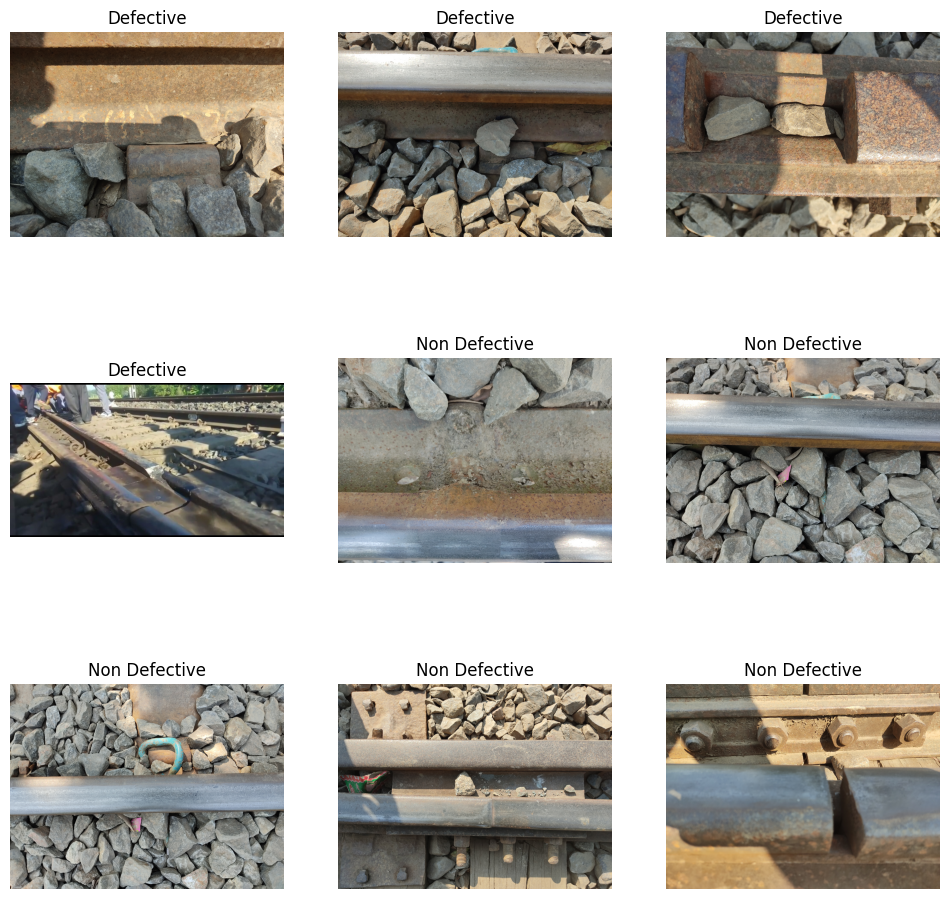

In [ ]:
# Image Loading adapted from https://www.kaggle.com/code/gaya3dev/railtrack-resnet50

# set index to 0
idx = 0

plt.figure(figsize=(12,12))
fig = plt.gcf()

# idx += 8 to grab 9 images
idx += 8
next_defective = [os.path.join(train_dir+'/Defective', fname)
                for fname in train_defective_fnames[idx-4:idx]]


next_nondefective = [os.path.join(train_dir+'/Non defective', fname)
                for fname in train_nondefective_fnames[idx-5:idx]]

for i, img_path in enumerate(next_defective + next_nondefective):
  #print(img_path)
  try:
    img = mpimg.imread(img_path)
    sp = plt.subplot(3, 3, i+1)

    # Title Images
    if '/content/Railway Track fault Detection Updated/Train/Defective' in img_path:
      sp.set_title('Defective')

    else:
      sp.set_title('Non Defective')

    sp.axis('Off')
    plt.imshow(img)

  # Error Handling in case values exceed index range somehow
  except ValueError:
    break

plt.show()


In [ ]:
# Define a basic CNN model

# Define the input shape
inputs = keras.layers.Input(shape=(150, 150, 3))

x = inputs

x = Conv2D(16, (3,3), padding = 'same', activation='relu')(x)
x = MaxPooling2D((2,2))(x)      # Max Pooling to downsample the image
x = BatchNormalization()(x)     # Batch Normalisation for regularisation

x = Conv2D(32, (3,3), padding = 'same', activation='relu')(x)
x = MaxPooling2D((2,2))(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)             # Dropout as "regularisation", values were experimented with during testing

x = Conv2D(64, (3,3), padding = 'same', activation='relu',)(x)
x = MaxPooling2D((2,2))(x)
x = BatchNormalization()(x)

x = Conv2D(64, (3,3), padding = 'same', activation='relu',)(x)
x = MaxPooling2D((2,2))(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

# Flatten our inputs as dense layers cannot accept a 3D tensor
x = Flatten()(x)
x = Dropout(0.3)(x)

x = Dense(128, activation='relu', kernel_regularizer = l2(l=0.01))(x)

predictions = Dense(1, activation='sigmoid')(x) #Sigmoid as we are doing binary classification

model3 = keras.models.Model(inputs=inputs, outputs=predictions)
opt = keras.optimizers.legacy.SGD(learning_rate=0.01, decay=1e-6, momentum=0.9, nesterov=True) #SGD with decay and momentum, I experimented with Adam also
#opt = Adam()

# Compile oour model and set the desired metrics, loss function (Binary crossentropy for binary classification)
model3.compile(optimizer = opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model3.summary()

In [ ]:
# define batch and target size, this was changed depending on the model being trained at the time, 224x224 for use with VGG16
# as this is VGG16's default input size

batch_size = 16
target_size = (224,224)

In [ ]:
# Data Augmentation

train_datagen = ImageDataGenerator(
                                   rescale=1./255,      #rescale pixel values so they are in the range of 0-1
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   fill_mode = "nearest",
                                   )

# This is where the augmented images are generated from
# As well as resizing of the images
# Train data is shuffled to help avoid bias during training due to the order of images in the folder
# Test data is not shuffled as this would throw off the results of evaluation later

train_generator = train_datagen.flow_from_directory(
                                  train_dir,
                                  target_size=target_size,
                                  batch_size=batch_size,
                                  color_mode='rgb',
                                  shuffle=True,
                                  seed=42,
                                  class_mode='binary'
                                  )

Found 299 images belonging to 2 classes.


In [ ]:
test_datagen = ImageDataGenerator(
                                  rescale = 1./255.,
                                  rotation_range = 40,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True
                                 )

test_generator = test_datagen.flow_from_directory(
                                  test_dir,
                                  target_size=target_size,
                                  batch_size=batch_size,
                                  color_mode='rgb',
                                  shuffle= False,
                                  seed=42,
                                  class_mode='binary'
                                  )

Found 22 images belonging to 2 classes.


In [ ]:
validation_datagen = ImageDataGenerator(
                                        rescale=1./255,
                                        rotation_range = 40,
                                        width_shift_range = 0.2,
                                        height_shift_range = 0.2,
                                        shear_range = 0.2,
                                        zoom_range = 0.2,
                                        horizontal_flip = True
                                       )

validation_generator = validation_datagen.flow_from_directory(
                                  validation_dir,
                                  target_size=target_size,
                                  batch_size=batch_size,
                                  color_mode='rgb',
                                  shuffle= True,
                                  seed=42,
                                  class_mode= 'binary'
                                  )

Found 62 images belonging to 2 classes.


In [ ]:
# Save model performance metrics

history = model3.fit(
                    train_generator,
                    steps_per_epoch = 299//batch_size,
                    validation_data = validation_generator,
                    validation_steps = 62//batch_size,
                    epochs=20,
                    batch_size=batch_size
                    )



In [ ]:
# Plot
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# Plot Loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# The model is oscillating a lot

In [ ]:
score = model3.evaluate(test_generator, steps= 3) # with test dataset
print(score)

# Unused Model

This section of the code can be skipped but I left it in anyway

In [ ]:
# New model with batch normalization and adding more dropout

inputs = keras.layers.Input(shape=(150, 150, 3))

x = inputs

x = Conv2D(16, (3,3), padding = 'same', activation='relu')(x)
x = MaxPooling2D((2,2))(x)
x = Dropout(0.5)(x)

x = Conv2D(32, (3,3), padding = 'same', activation='relu')(x)
x = MaxPooling2D((2,2))(x)
x = Dropout(0.5)(x)

x = Conv2D(64, (3,3), padding = 'same', activation='relu',)(x)
x = MaxPooling2D((2,2))(x)
x = Dropout(0.5)(x)

x = Conv2D(64, (3,3), padding = 'same', activation='relu',)(x)
x = MaxPooling2D((2,2))(x)
x = Dropout(0.5)(x)

x = Flatten()(x)
x = Dropout(0.5)(x)

x = Dense(128, activation='relu', kernel_regularizer = l2(l=0.01))(x)

predictions = Dense(1, activation='sigmoid')(x)

model = keras.models.Model(inputs=inputs, outputs=predictions)
opt = keras.optimizers.legacy.SGD(learning_rate=0.001, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer = opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

# Notes:
# This second model converged to a local minimum, so I reduced learning rate by factor of 10 and removed some dropout,
# but then the model validation accuracy was fluctuating a lot
# model kept converging to local minima even with batchnorm and adding/removing dropout
# not sure why

In [ ]:
batch_size = 64

history2 = model.fit(
                    train_generator,
                    steps_per_epoch = 299//batch_size,
                    validation_data = validation_generator,
                    validation_steps = 62//32,
                    epochs=20,
                    batch_size=batch_size
                    )

In [ ]:
# Plot Accuracy
plt.plot(history2.history2['accuracy'])
plt.plot(history2.history2['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# Plot Loss
plt.plot(history2.history2['loss'])
plt.plot(history2.history2['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


# Transfer Learning

To run this section successfully you need to go back and set the target_size variable to be equal to (224,224), and re run the datagen cells otherwise this will not run

In [ ]:
tf_model = VGG16(include_top = False, input_shape = (224,224,3), weights = 'imagenet')

# Freeze the layers so weights are not lost
for layer in tf_model.layers:
    layer.trainable = False

x = tf_model.output

# Flatten images for use in the dense layers
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation = 'relu')(x)


predictions = Dense(1, activation='sigmoid')(x)

tf_modelVGG16 = keras.models.Model(inputs = tf_model.input, outputs = predictions)

# opt = keras.optimizers.legacy.SGD(learning_rate=0.001, decay=1e-6, momentum=0.9, nesterov=True)

tf_modelVGG16.compile(optimizer = 'adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

tf_modelVGG16.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
history3 = tf_modelVGG16.fit(
                              train_generator,
                              steps_per_epoch = 299//batch_size,
                              validation_data = validation_generator,
                              validation_steps = 62//batch_size,
                              epochs=30,
                              batch_size=batch_size
                            )

Epoch 1/30
18/18 [==============================] - 50s 2s/step - loss: 1.3629 - accuracy: 0.5035 - val_loss: 1.3288 - val_accuracy: 0.5417
Epoch 2/30
18/18 [==============================] - 45s 2s/step - loss: 0.7992 - accuracy: 0.6396 - val_loss: 0.6786 - val_accuracy: 0.6458
Epoch 3/30
18/18 [==============================] - 44s 2s/step - loss: 0.6403 - accuracy: 0.7032 - val_loss: 0.6401 - val_accuracy: 0.6250
Epoch 4/30
18/18 [==============================] - 44s 2s/step - loss: 0.5820 - accuracy: 0.7102 - val_loss: 0.5587 - val_accuracy: 0.6875
Epoch 5/30
18/18 [==============================] - 44s 3s/step - loss: 0.4584 - accuracy: 0.7774 - val_loss: 0.6088 - val_accuracy: 0.7292
Epoch 6/30
18/18 [==============================] - 44s 3s/step - loss: 0.4920 - accuracy: 0.7562 - val_loss: 0.5424 - val_accuracy: 0.6875
Epoch 7/30
18/18 [==============================] - 45s 2s/step - loss: 0.5138 - accuracy: 0.7208 - val_loss: 0.2941 - val_accuracy: 0.8750
Epoch 8/30
18/18 [==

In [ ]:
# I lost the model that I used to obtain the plots in my report, so I retrained the transfer learning model with 30 epochs using Adam as an optimiser
# I am saving this model here.

model = tf_modelVGG16

model.save("Oleary_Eoghan_Transfer_Model")

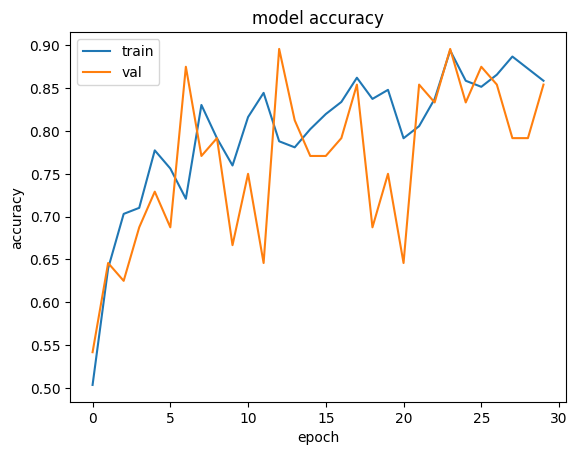

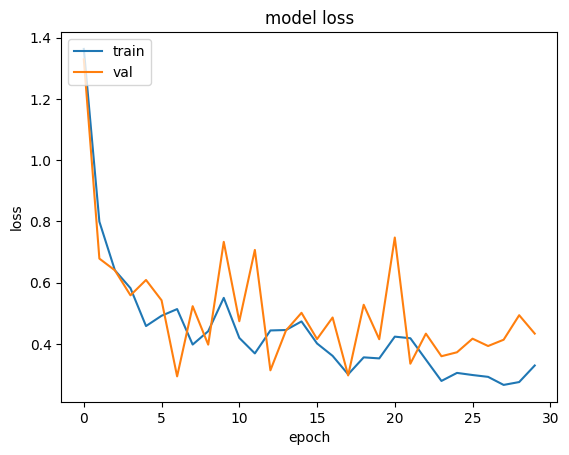

In [ ]:
# Plot Accuracy
plt.plot(history3.history['accuracy'])
plt.plot(history3.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# Plot Loss
plt.plot(history3.history['loss'])
plt.plot(history3.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


In [ ]:
score = tf_modelVGG16.evaluate(test_generator, steps= 3) # with test dataset
print(score)

2/3 [===================>..........] - ETA: 0s - loss: 0.5826 - accuracy: 0.8636

3/3 [==============================] - 3s 405ms/step - loss: 0.5826 - accuracy: 0.8636
[0.5826359391212463, 0.8636363744735718]


# Visualising Channels From The Transfer Learning Model

This code for visualising channel outputs is taken from Chapter 5 of Francois Chollet's Deep Learning with Python

Chollet, F. (2017). Deep learning with python. Manning Publications.

In [ ]:
img_path = "/content/Railway Track fault Detection Updated/Validation/Defective/IMG_20201211_121346.jpg"

img = image.load_img(img_path, target_size=target_size)

img_tensor = image.img_to_array(img)

img_tensor = np.expand_dims(img_tensor, axis = 0)
img_tensor /= 255.

In [ ]:
layer_outputs = [layer.output for layer in tf_modelVGG16.layers[:8]]
activation_model = Model(inputs = tf_modelVGG16.input, outputs = layer_outputs)

In [ ]:
activations = activation_model.predict(img_tensor)

1/1 [==============================] - 0s 83ms/step


<ipython-input-42-5ea118d2aa5a>:38: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(display_grid, aspect = "auto", cmap = "viridis")
<ipython-input-42-5ea118d2aa5a>:28: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')


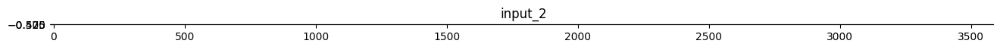

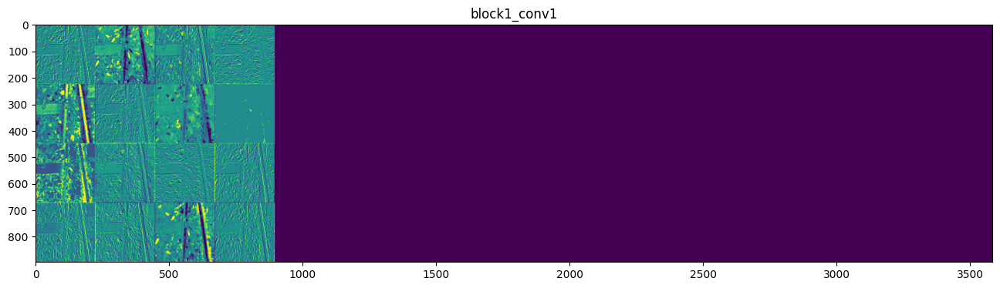

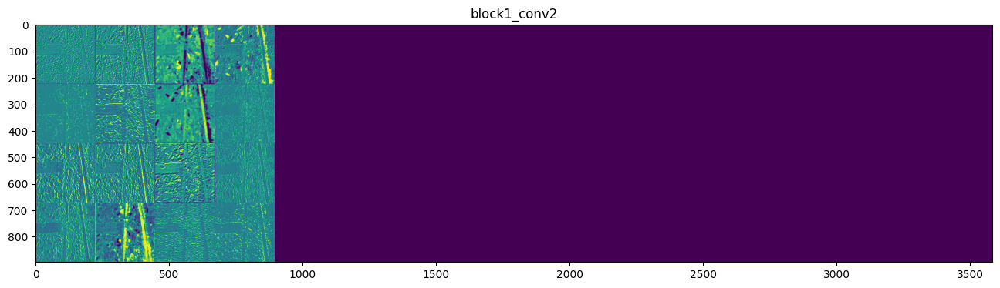

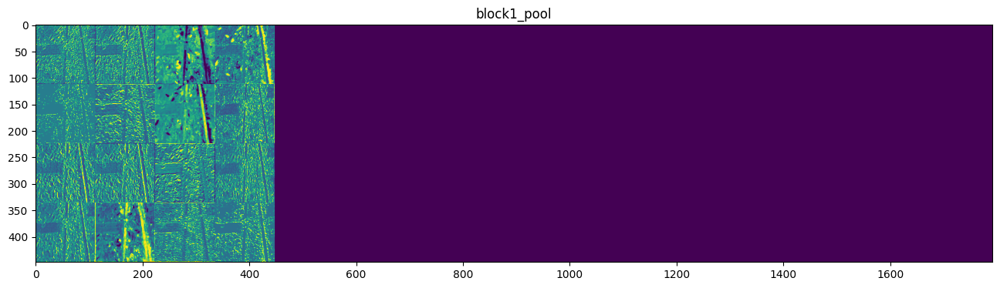

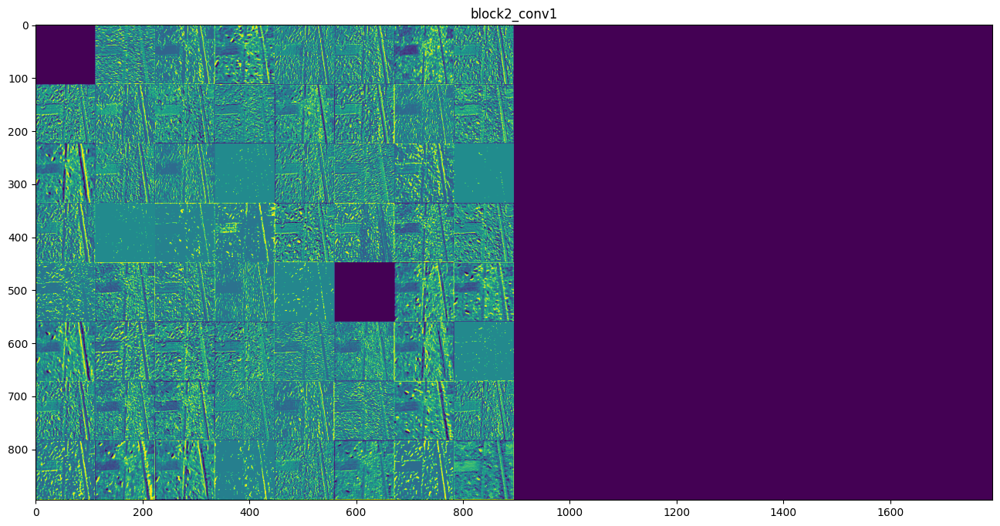

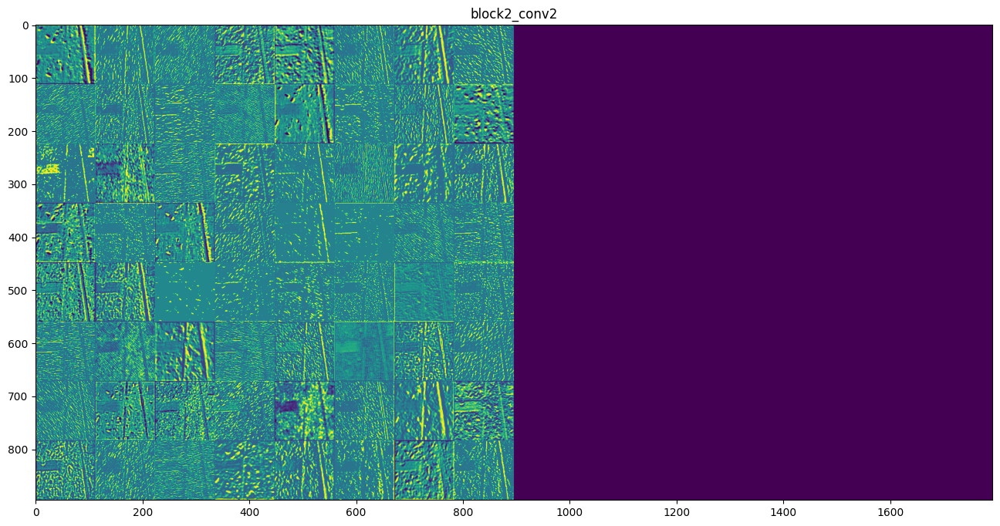

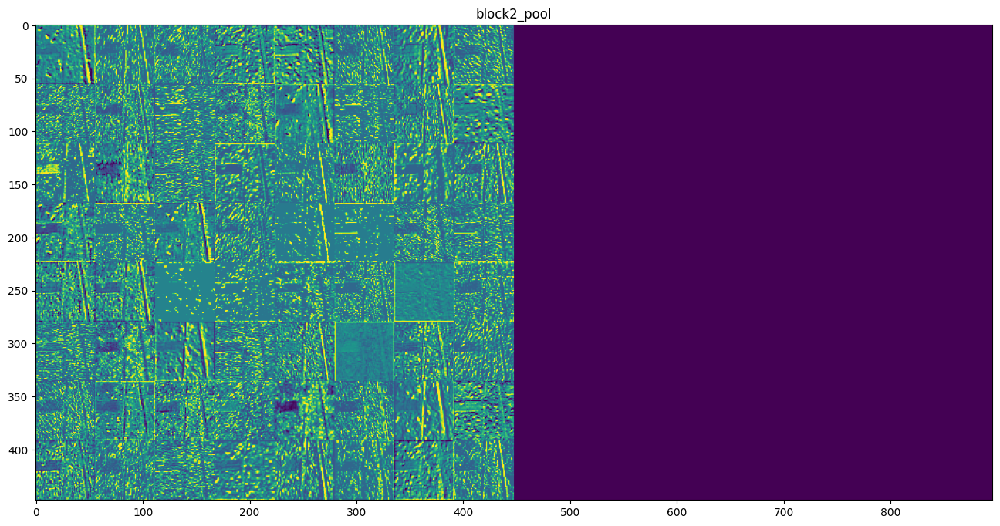

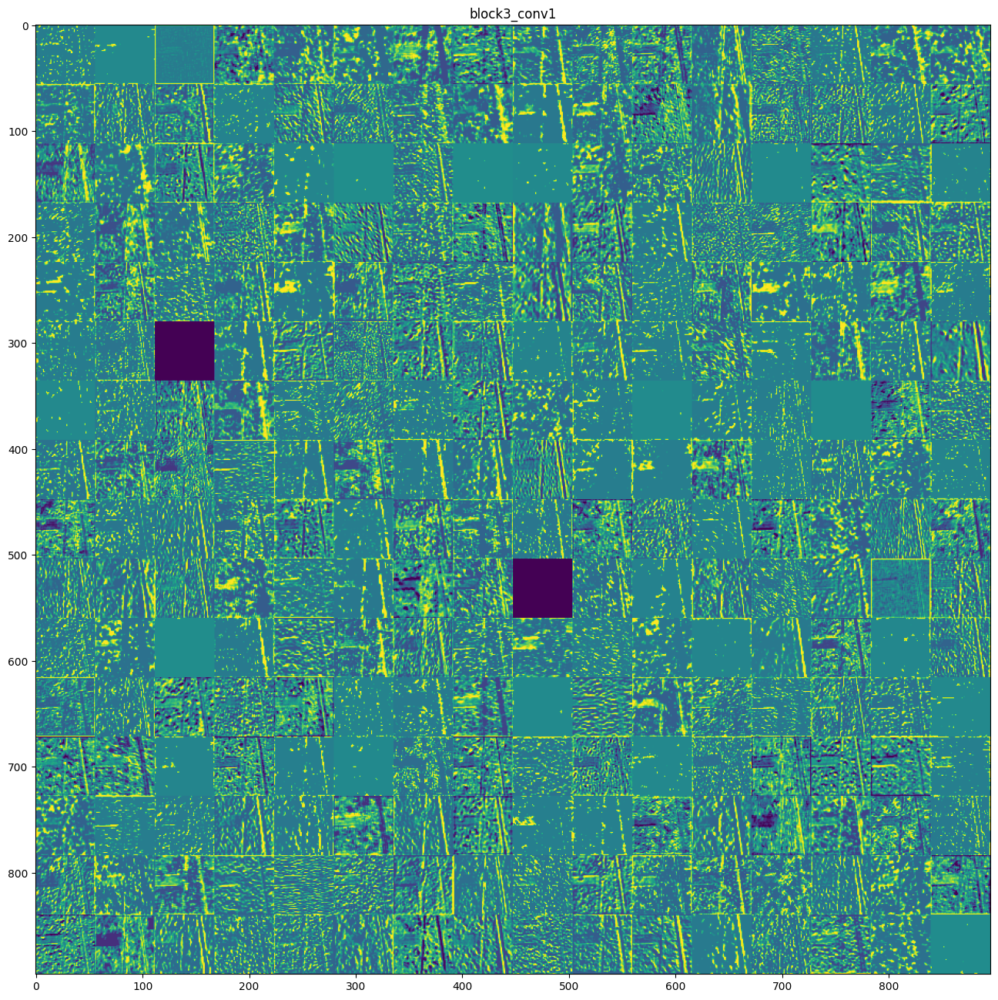

In [ ]:
#plot activations for the layers of the transfer learning model

# Plot activation for channels of the simple CNN

layer_names = []
images_per_row = 16

for layer in tf_modelVGG16.layers[:12]:

  layer_names.append(layer.name)


for layer_name, layer_activation in zip(layer_names, activations):

  n_features = layer_activation.shape[-1] # number of features
  size1 = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size1*n_cols, size1*images_per_row))

  for col in range(n_cols):
    for row in range(n_cols):

      channel_image = layer_activation[0,:,:, col*images_per_row + row]
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')

      display_grid[col*size1 : (col+1)*size1, row*size1: (row+1)*size1] = channel_image

  scale = 1./ size1

  plt.figure(figsize=(scale*display_grid.shape[1], scale* display_grid.shape[0]))

  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect = "auto", cmap = "viridis")

# Metrics

Confusion matrices, ROC plots for both models

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
# Make Predictions With Both Models, you may need to change target size first to (150,150) and rerun all datagen cells

predY = model3.predict(test_generator)

y_true = test_generator.classes

# threshold values, to set the probability values to either class 1 (nondefective) or 0 (defective)
predY[predY > 0.5] = 1
predY[predY <= 0.5] = 0

In [ ]:
# check that values have been thresholded
print(predY)


In [ ]:
labels = ['Defective', 'Non Defective']
print(classification_report(y_true, predY, target_names=labels))

NameError: name 'y_true' is not defined

In [ ]:
# go back and change target size and run the datagen cells again for this to work (224,224)

predYVGG = tf_modelVGG16.predict(test_generator)

# Get actual labels
#print(predYVGG)

y_trueVGG = test_generator.classes

#print(y_trueVGG)

predYVGG[predYVGG > 0.5] = 1
predYVGG[predYVGG <= 0.5] = 0

#print(predYVGG) sanity checks, no need for these anymore

2/2 [==============================] - 3s 976ms/step


In [ ]:
print(classification_report(y_trueVGG, predYVGG, target_names=labels))

               precision    recall  f1-score   support

    Defective       0.79      1.00      0.88        11
Non Defective       1.00      0.73      0.84        11

     accuracy                           0.86        22
    macro avg       0.89      0.86      0.86        22
 weighted avg       0.89      0.86      0.86        22



In [ ]:
# Plot ROC curves

from sklearn.metrics import roc_curve, auc

fpr1, tpr1, thresholds = roc_curve(y_true, predY)
auc1 = auc(fpr1, tpr1)

fpr, tpr, thresholds = roc_curve(y_trueVGG, predYVGG)
auc = auc(fpr, tpr)


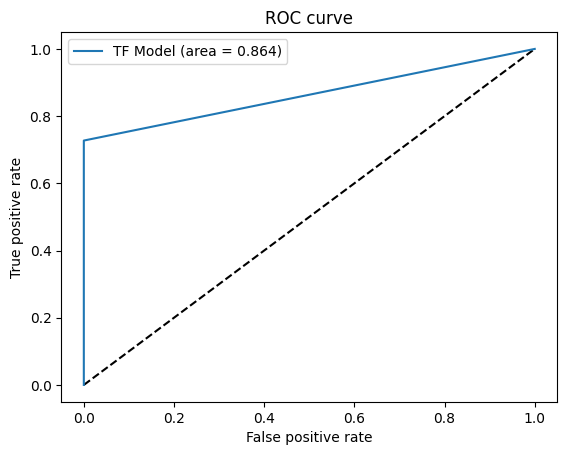

In [ ]:
# Plot ROC curves

# The closer the plot reaches to the top corner, the better

plt.figure(1)
plt.plot([0,1],[0,1], 'k--')
plt.plot(fpr1, tpr1, label='CNN (area = {:.3f})'.format(auc1))
plt.plot(fpr, tpr, label='TF Model (area = {:.3f})'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()